In [1]:
from skimage import exposure
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg
import os
import seaborn as sns
import random
from scipy.ndimage import median_filter, gaussian_filter
from scipy.ndimage import rotate
from skimage import img_as_float
from IPython.display import display, clear_output
import time
sns.set()

In [2]:
train_df = pd.read_csv("nih/train-small.csv")

YUKARIDA VERİ SETİ YÜKLENİYOR

In [3]:
print(f'There are {train_df.shape[0]} rows and {train_df.shape[1]} columns in this data frame')
train_df.head(10)

There are 1000 rows and 16 columns in this data frame


,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0
5,00001232_002.png,1,1,0,0,1,0,0,0,1,0,0,1232,0,0,0
6,00017135_000.png,0,0,0,0,0,0,0,0,0,0,0,17135,0,0,0
7,00027235_000.png,0,0,0,0,0,0,0,0,0,0,0,27235,0,0,0
8,00014197_007.png,0,0,0,0,0,0,0,0,0,0,0,14197,0,0,0
9,00011584_002.png,0,0,0,0,0,0,0,0,0,0,0,11584,0,0,0


# Veri setinin içeriği görüntülendi.

In [4]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int64 
 8   Hernia              1000 non-null   int64 
 9   Infiltration        1000 non-null   int64 
 10  Mass                1000 non-null   int64 
 11  Nodule              1000 non-null   int64 
 12  PatientId           1000 non-null   int64 
 13  Pleural_Thickening  1000 non-null   int64 
 14  Pneumonia           1000 non-null   int64 
 15  Pneumothorax        1000 non-null   int64 
dtypes: int64(15), object(1)
m

In [5]:
patient_counts = train_df['PatientId'].value_counts()
duplicate_patients = patient_counts[patient_counts > 1]
print(duplicate_patients)
#HASTALARIN KAÇAR TANE VERİSİNİN BULUNUĞU BİLGİSİ

PatientId
20213    6
13003    4
13111    4
25628    3
8081     3
26825    3
5089     3
15647    3
30393    2
16052    2
7523     2
7670     2
20113    2
13685    2
13408    2
15732    2
26505    2
5646     2
6039     2
17158    2
5400     2
772      2
28606    2
4523     2
26810    2
22883    2
8767     2
27455    2
3028     2
23128    2
19899    2
28844    2
22526    2
16019    2
359      2
10909    2
30629    2
6906     2
6585     2
25527    2
11355    2
10294    2
15530    2
20819    2
23372    2
12045    2
9185     2
17417    2
26232    2
4858     2
14758    2
27260    2
10531    2
27235    2
13209    2
18860    2
9798     2
27287    2
16109    2
Name: count, dtype: int64


# HASTALARIN KAÇAR TANE VERİSİNİN BULUNUĞU BİLGİSİ

In [6]:
print(f"Toplam hasta sayısı {train_df['PatientId'].count()}, tekil ID {train_df['PatientId'].nunique()}")

Toplam hasta sayısı 1000, tekil ID 928


In [7]:
patient_20213_data = train_df[train_df['PatientId'] == 20213]
print(patient_20213_data)
#Burada 20213 PatientId'ye sahip kayıtlar görüntülendi. Önceki sayımda bu PatientId'ye sahip 6 kayıt olduğunu bildirmişti bunu doğrulamak için bu görüntülemeyi yaptım.

                Image  Atelectasis  Cardiomegaly  Consolidation  Edema  \
197  00020213_004.png            0             0              0      0   
296  00020213_091.png            1             0              1      0   
440  00020213_036.png            0             0              1      0   
789  00020213_028.png            0             0              1      0   
840  00020213_103.png            1             0              0      0   
985  00020213_003.png            0             0              1      0   

     Effusion  Emphysema  Fibrosis  Hernia  Infiltration  Mass  Nodule  \
197         0          0         0       0             1     0       0   
296         1          0         0       0             0     0       0   
440         0          0         0       0             0     0       0   
789         0          0         0       0             0     0       0   
840         0          0         0       0             1     0       0   
985         1          0         0   

# Burada 20213 PatientId'ye sahip kayıtlar görüntülendi. Önceki sayımda bu PatientId'ye sahip 6 kayıt olduğunu bildirmişti bunu doğrulamak için bu görüntülemeyi yaptım.

In [8]:
columns = train_df.keys()
columns=list(columns)
print(columns)

['Image', 'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'PatientId', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


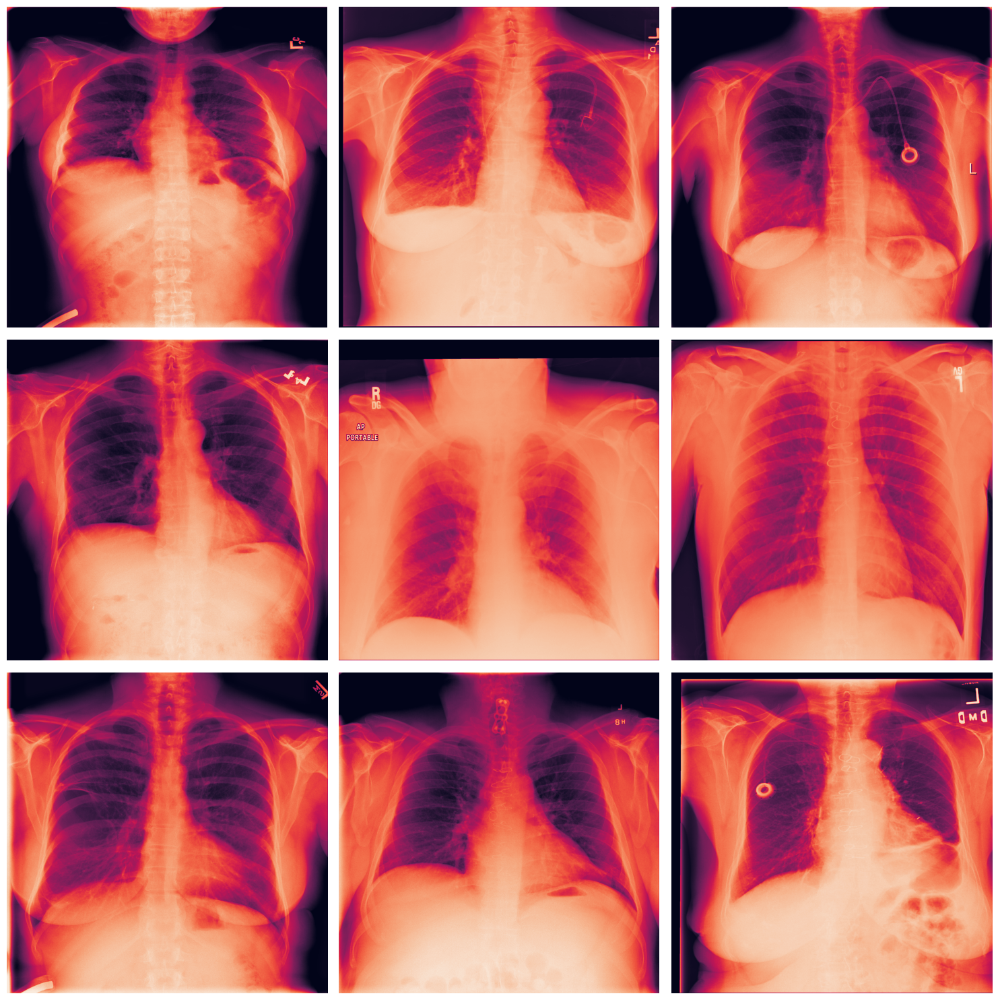

In [9]:
random_indices = random.sample(range(len(train_df)), 9)
images = train_df.loc[random_indices, 'Image']
image_folder = 'nih/images_small'
# Eğer images boş değilse devam et
if not images.empty:
    # En fazla 9 tane
    random_indices = random.sample(range(len(images)), min(9, len(images)))

    selected_images = images.iloc[random_indices]
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    
    # Her bir görüntüyü subplot'a ekleme
    for i, ax in enumerate(axes.flat):
        img_path = selected_images.iloc[i]
        
        full_img_path = os.path.join(image_folder, img_path)
        img = mpimg.imread(full_img_path)  # Görüntüyü okuma
        #print(img)
        ax.imshow(img)
        ax.axis('off')  # Eksenleri gizleme

    plt.tight_layout()  # Altların düzgün yerleşmesi için
    plt.show()
        
else:
    print("Görüntü veri setinde herhangi bir veri bulunamadı.")

In [10]:
    for i, ax in enumerate(axes.flat):
        img_path = selected_images.iloc[i]
        
        full_img_path = os.path.join(image_folder, img_path)
        img = mpimg.imread(full_img_path)  # Görüntüyü okuma
        #print(img)
        img_flat = img.flatten()
        ax.imshow(img)
        ax.axis('off')  # Eksenleri gizleme

        # Görüntü için istatistiksel değerleri hesaplama
        img_flat = img.flatten()  # Görüntüyü tek bir vektöre dönüştür

        # İstatistiksel hesaplamalar
        img_min = np.min(img_flat)  # Minimum değer
        img_max = np.max(img_flat)  # Maksimum değer
        img_mean = np.mean(img_flat)  # Ortalama değer
        img_std = np.std(img_flat)  # Standart sapma

        # İstatistikleri yazdırma
        print(f"Image {i+1}:")
        print(f"  Min: {img_min:.4f}")
        print(f"  Max: {img_max:.4f}")
        print(f"  Ortalama: {img_mean:.4f}")
        print(f"  Standard Sapma: {img_std:.4f}")
        print("-" * 40)

    plt.tight_layout()  # Altların düzgün yerleşmesi için
    plt.show()

Image 1:
  Min: 0.0000
  Max: 1.0000
  Ortalama: 0.4374
  Standard Sapma: 0.3014
----------------------------------------
Image 2:
  Min: 0.0000
  Max: 0.9961
  Ortalama: 0.6082
  Standard Sapma: 0.2632
----------------------------------------
Image 3:
  Min: 0.0000
  Max: 1.0000
  Ortalama: 0.4541
  Standard Sapma: 0.2861
----------------------------------------
Image 4:
  Min: 0.0000
  Max: 0.9765
  Ortalama: 0.4913
  Standard Sapma: 0.2810
----------------------------------------
Image 5:
  Min: 0.0000
  Max: 1.0000
  Ortalama: 0.6340
  Standard Sapma: 0.2475
----------------------------------------
Image 6:
  Min: 0.0000
  Max: 0.9294
  Ortalama: 0.5483
  Standard Sapma: 0.1737
----------------------------------------
Image 7:
  Min: 0.0000
  Max: 1.0000
  Ortalama: 0.4926
  Standard Sapma: 0.2631
----------------------------------------
Image 8:
  Min: 0.0000
  Max: 0.9569
  Ortalama: 0.5142
  Standard Sapma: 0.2787
----------------------------------------
Image 9:
  Min: 0.0000
 

<Figure size 640x480 with 0 Axes>

# Görsellerin hepsinin ayrı ayrı min, max, ortalama ve standart sapma değerleri görüntülendi.

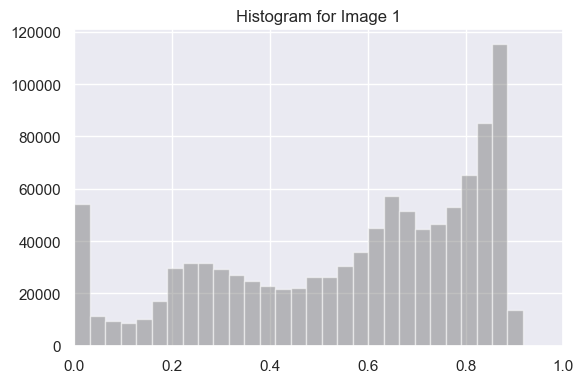

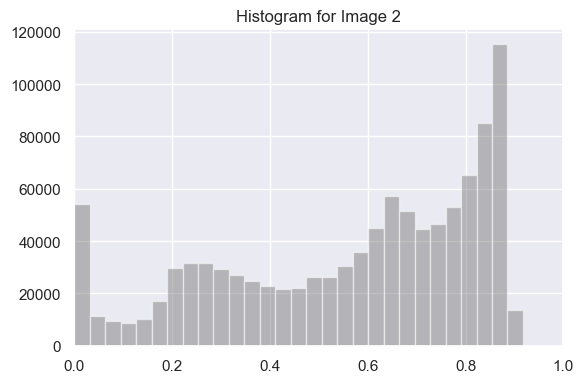

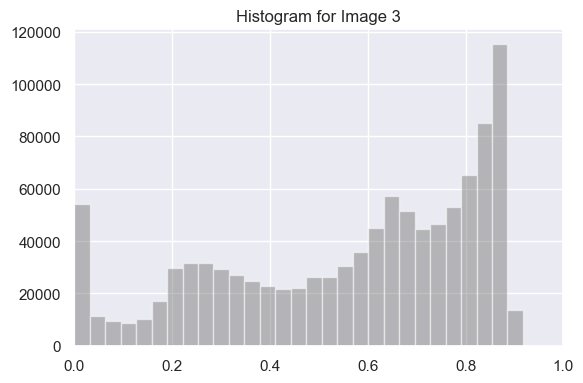

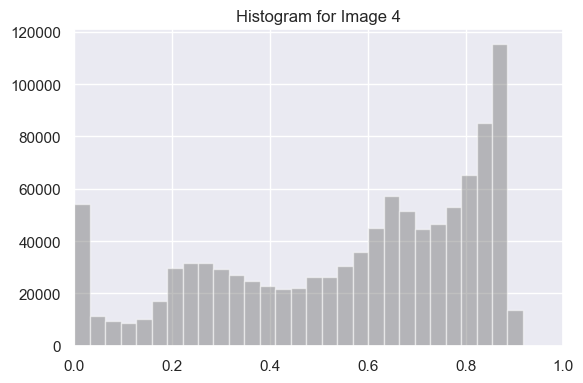

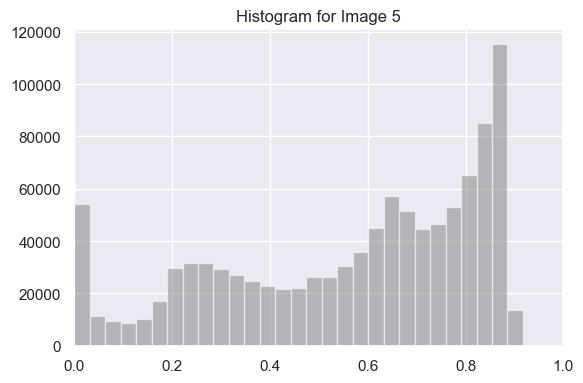

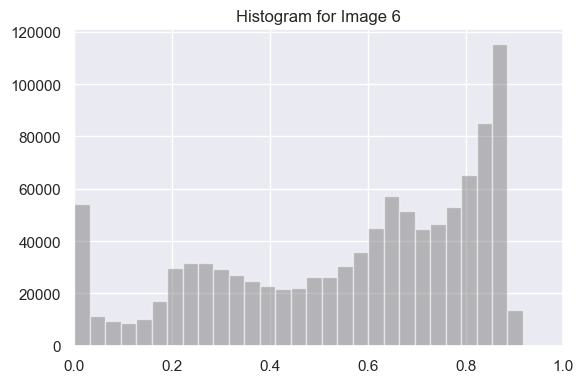

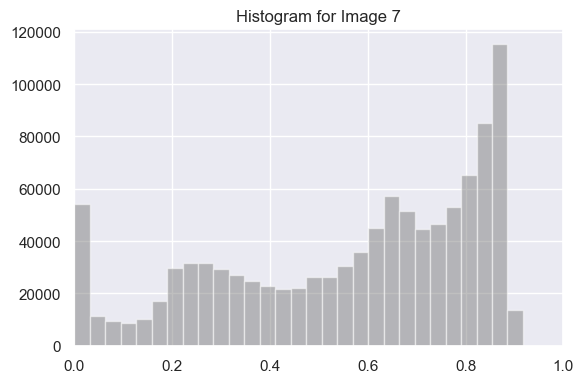

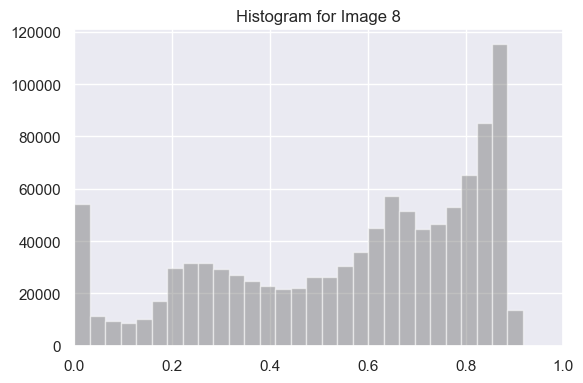

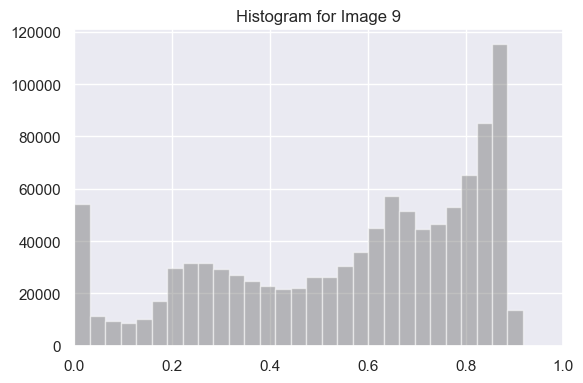

<Figure size 640x480 with 0 Axes>

In [11]:
    for i, ax in enumerate(axes.flat):
        img_path = selected_images.iloc[i]
        
        # Görsel tam yolu
        full_img_path = os.path.join(image_folder, img_path)
        
        # görsel okuma
        img = mpimg.imread(full_img_path)
        
        # Histogram gösterme
        fig_hist, ax_hist = plt.subplots(figsize=(6, 4))
       
        #bins=50: Piksel yoğunluklarını 50 eşit aralığa bölüyor.
        #alpha=0.7: Histogramın hafifçe şeffaf olmasını sağlıyor

        # Gri tonlamalı görüntünün piksel yoğunluğu histogramı
        ax_hist.hist(img_flat, bins=30, color='gray', alpha=0.5)

        #print(ax_hist)
        
        ax_hist.set_title(f'Histogram for Image {i+1}')
        ax_hist.set_xlim(0, 1)  # Piksel değerleri 0 ile 1 arasında

        # Histogramı göster
        plt.tight_layout()
        plt.show()


    plt.tight_layout()  # Altların düzgün yerleşmesi için
    plt.show()

# Histogram grafiğine göre piksel yoğunlğu 0.8 olan pikseller 120 000 tane ile en fazla görünüyor.

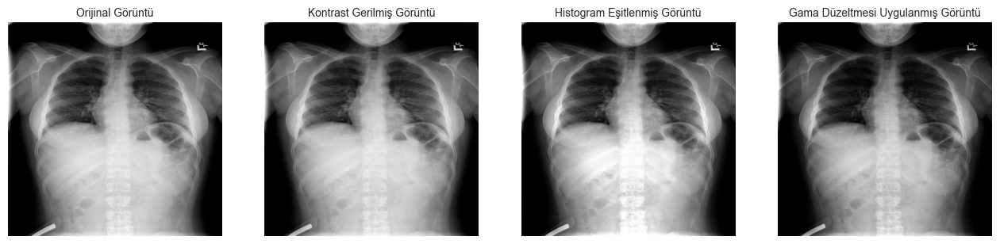

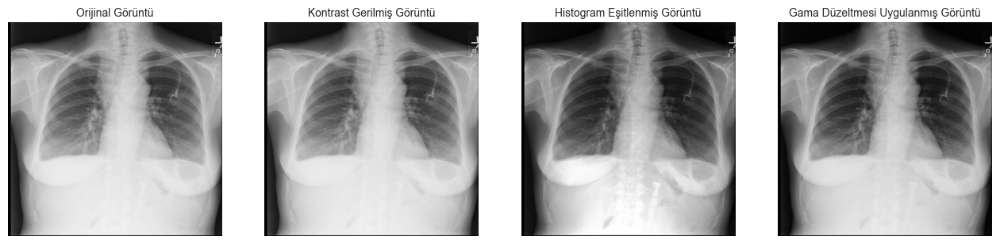

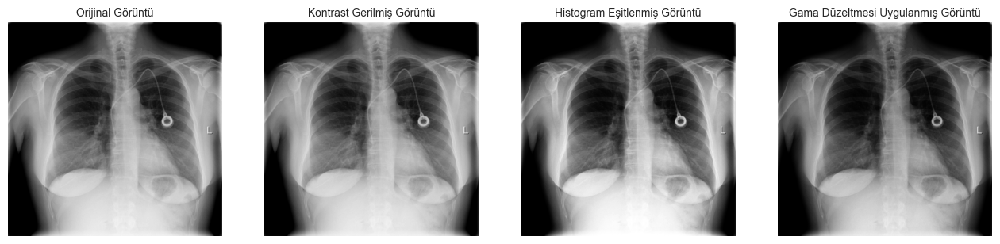

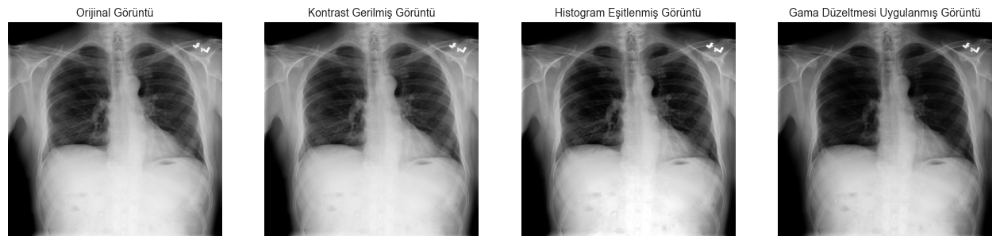

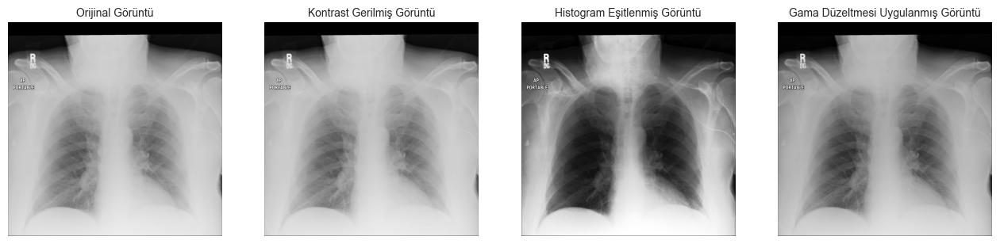

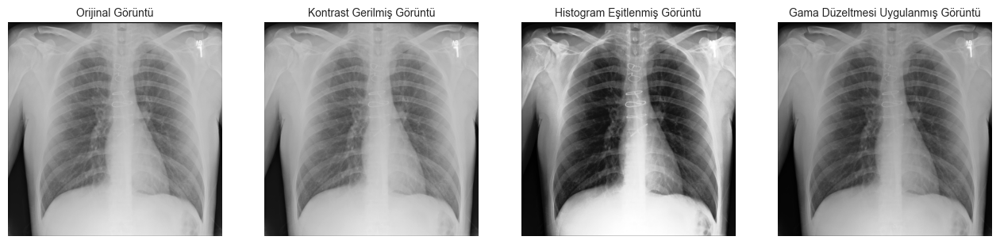

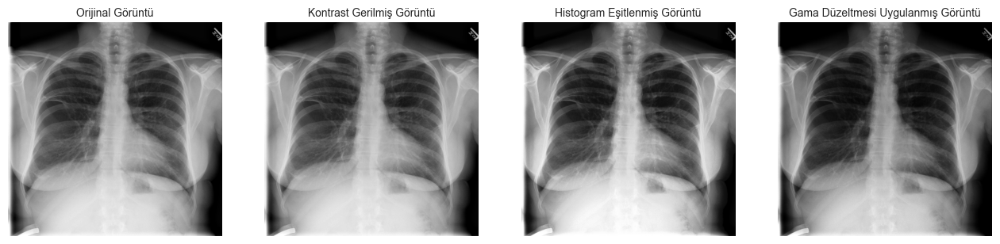

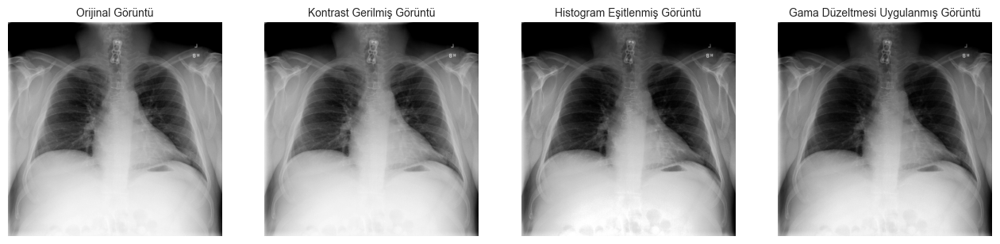

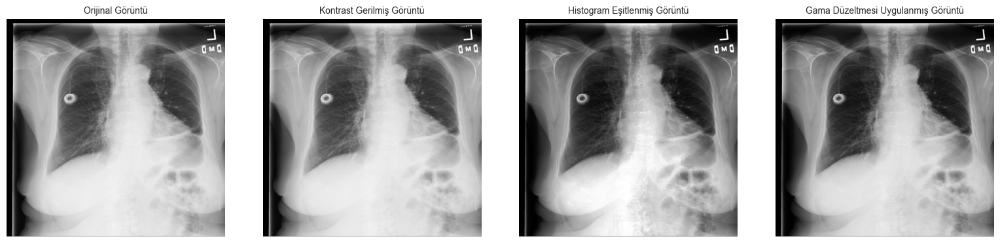

In [12]:
for i, ax in enumerate(axes.flat):
        img_path = selected_images.iloc[i]
        
        full_img_path = os.path.join(image_folder, img_path)
        img = mpimg.imread(full_img_path)  # Görüntüyü okuma
        #print(img)
        img_flat = img.flatten()
        image_array = np.array(img)
        ax.imshow(img)
        ax.axis('off')  # Eksenleri gizleme

        # Görüntü için istatistiksel değerleri hesaplama
        img_flat = img.flatten()  # Görüntüyü tek bir vektöre dönüştür

        # İstatistiksel hesaplamalar
        img_min = np.min(img_flat)  # Minimum değer
        img_max = np.max(img_flat)  # Maksimum değer
        img_mean = np.mean(img_flat)  # Ortalama değer
        img_std = np.std(img_flat)  # Standart sapma

        # Kontras germe işlemi burada yapılıyor
        stretched_image = (image_array - img_min) / (img_max - img_min) * 255
        stretched_image = stretched_image.astype(np.uint8)

        #Histogram eşitleme piksek yoğunluklarını diğer piksellere yayıyor
        equalized_image = exposure.equalize_hist(image_array)

        #gamma_value = 2.5
        gamma_value = 1.5 
        gamma_corrected_image = exposure.adjust_gamma(image_array, gamma_value)

        plt.figure(figsize=(16, 4)) # Dörde böldük sütunları

        # Orijinal Görüntü
        plt.subplot(1, 4, 1)  # 1 satır, 4 sütun, ilk görsel
        plt.title("Orijinal Görüntü", fontsize=10)
        plt.imshow(image_array, cmap="gray")  # Gri tonlamalı olarak gösteriyoruz
        plt.axis("off")
        
        # Kontrast Gerilmiş Görüntü
        plt.subplot(1, 4, 2)  # 1 satır, 4 sütun, ikinci görsel
        plt.title("Kontrast Gerilmiş Görüntü", fontsize=10)
        plt.imshow(stretched_image, cmap="gray")  # Kontrastı gerilmiş görüntü
        plt.axis("off")
        
        # Histogram Eşitleme Uygulanmış Görüntü
        plt.subplot(1, 4, 3)  # 1 satır, 4 sütun, üçüncü görsel
        plt.title("Histogram Eşitlenmiş Görüntü", fontsize=10)
        plt.imshow(equalized_image, cmap="gray")  # Histogram eşitlenmiş görüntü
        plt.axis("off")
        
        # Gama Düzeltmesi Uygulanmış Görüntü
        plt.subplot(1, 4, 4)  # 1 satır, 4 sütun, dördüncü görsel
        plt.title("Gama Düzeltmesi Uygulanmış Görüntü", fontsize=10)
        plt.imshow(gamma_corrected_image, cmap="gray")  # Gama düzeltmesi yapılmış görüntü
        plt.axis("off")

plt.tight_layout(pad=2.0) 
#plt.tight_layout()  # Altların düzgün yerleşmesi için
plt.show()


# Kontras Germe - Histogram Eşitleme - Gamma Düzeltme uygulanmış görseller görüntüleniyor. Yukarıda

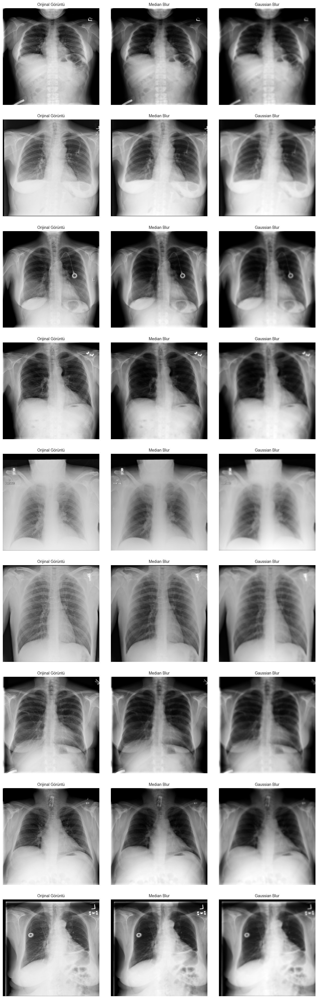

In [13]:
fig, axes = plt.subplots(len(selected_images), 3, figsize=(12, len(selected_images) * 4))

for i, ax_row in enumerate(axes):  # Her bir satır için
    img_path = selected_images.iloc[i]
    full_img_path = os.path.join(image_folder, img_path)
    img = mpimg.imread(full_img_path)  # Görüntüyü okuma
    image_array = np.array(img)

    # Median ve Gaussian Blur uygulama
    gamma_value = 1.5
    gamma_corrected_image = exposure.adjust_gamma(image_array, gamma_value)
    median_blur_image = median_filter(gamma_corrected_image, size=10)
    gaussian_blur_image = gaussian_filter(gamma_corrected_image, sigma=5)

    # Orijinal Görüntü
    ax_row[0].imshow(image_array, cmap="gray")
    ax_row[0].set_title("Orijinal Görüntü", fontsize=10)
    ax_row[0].axis("off")

    # Median Blur Uygulanan Görüntü
    ax_row[1].imshow(median_blur_image, cmap="gray")
    ax_row[1].set_title("Median Blur", fontsize=10)
    ax_row[1].axis("off")

    # Gaussian Blur Uygulanan Görüntü
    ax_row[2].imshow(gaussian_blur_image, cmap="gray")
    ax_row[2].set_title("Gaussian Blur", fontsize=10)
    ax_row[2].axis("off")

plt.tight_layout(pad=2.0)  # Görseller arasındaki boşlukları düzenler
plt.show()

# Gamma düzeltilmiş görüntüye median ve gaussian blur uygulandı sounçlar görüntüleniyor.

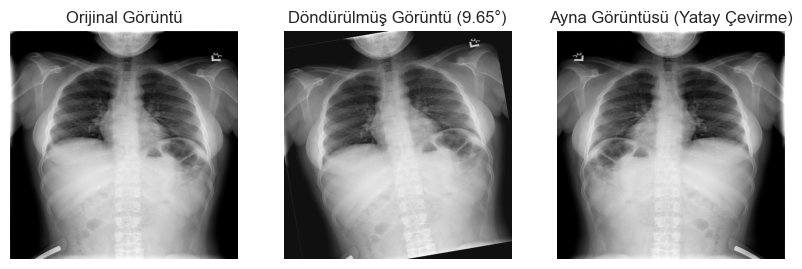

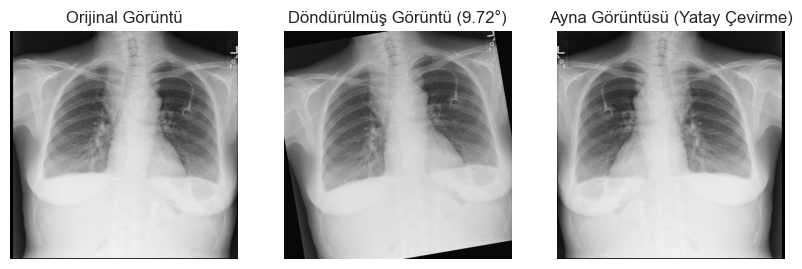

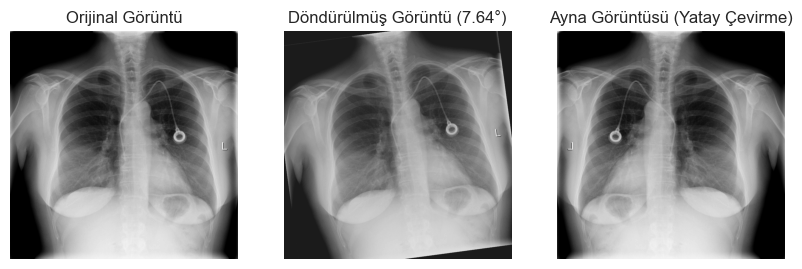

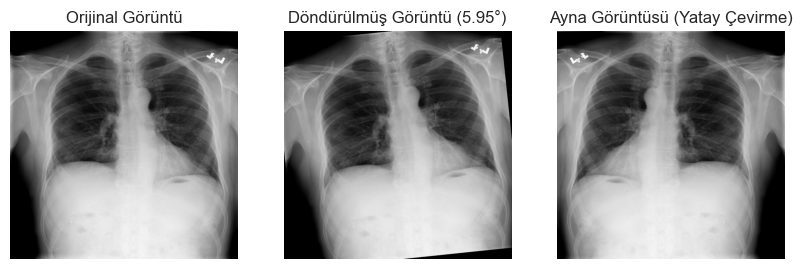

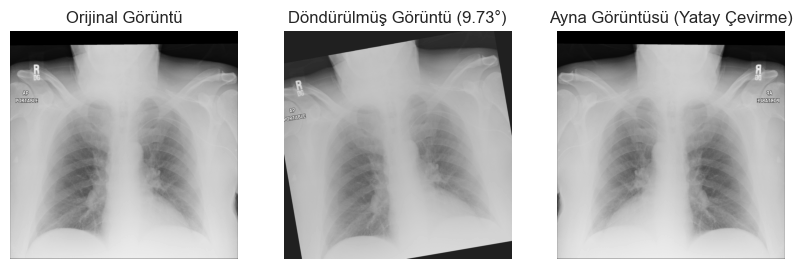

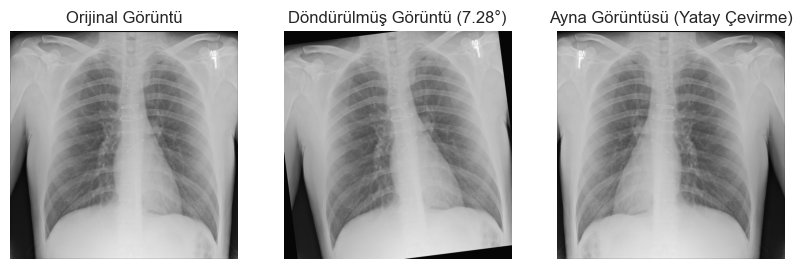

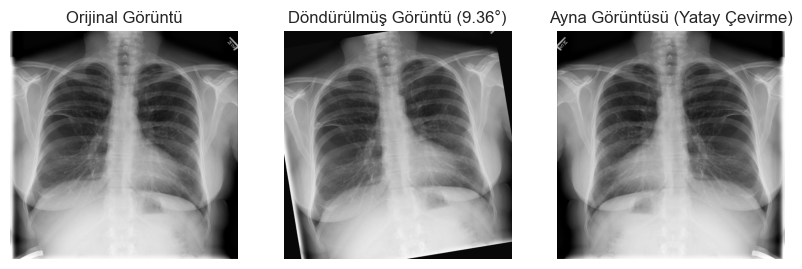

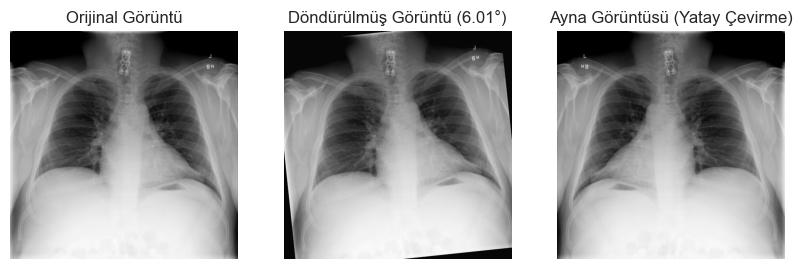

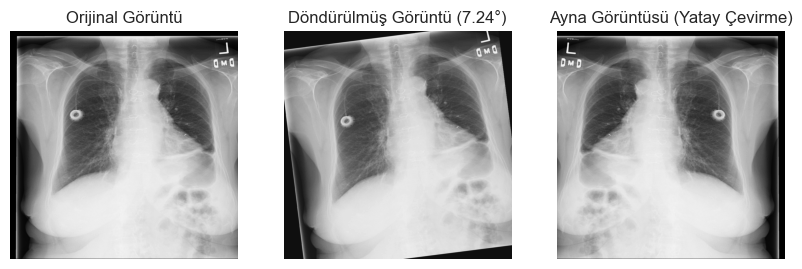

In [14]:


for i, ax_row in enumerate(axes):  # Her bir satır için
    img_path = selected_images.iloc[i]
    full_img_path = os.path.join(image_folder, img_path)
    img = mpimg.imread(full_img_path)  # Görüntüyü okuma
    image_array = np.array(img)

    random_angle = np.random.uniform(5, 10)

    # Görüntüyü döndürme
    rotated_image = rotate(image_array, angle=random_angle, reshape=False)

    # Görüntüyü yatay olarak çevirme (ayna görüntüsü)
    flipped_image = np.fliplr(image_array)
    
    # Orijinal ve döndürülmüş görüntüleri gösterme
    plt.figure(figsize=(10, 5))
    
    # Orijinal Görüntü
    plt.subplot(1, 3, 1)
    plt.title("Orijinal Görüntü")
    plt.imshow(image_array, cmap="gray")
    plt.axis("off")
    
    # Döndürülmüş Görüntü
    plt.subplot(1, 3, 2)
    plt.title(f"Döndürülmüş Görüntü ({random_angle:.2f}°)")
    plt.imshow(rotated_image, cmap="gray")
    plt.axis("off")

    # Yatay Çevrilmiş Görüntü
    plt.subplot(1, 3, 3)
    plt.title("Ayna Görüntüsü (Yatay Çevirme)")
    plt.imshow(flipped_image, cmap="gray")
    plt.axis("off")


plt.show()

In [ ]:
# Yukarda görüntünün sola doğru küçük oranlarda döndürülüyor. 3. Sütunda tam tur rotate ediliyor. (Ayna Çevirme) 

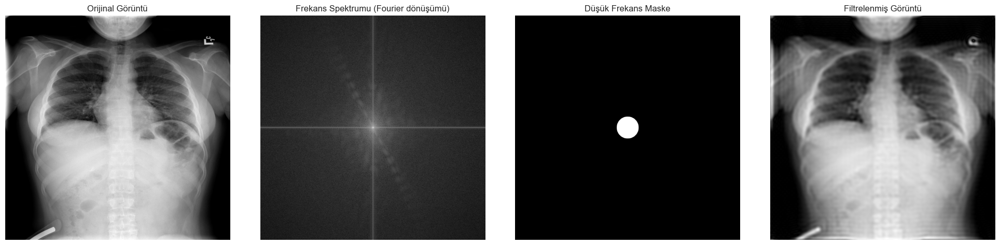

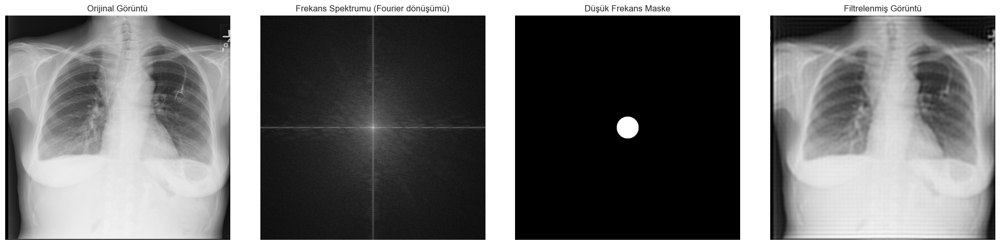

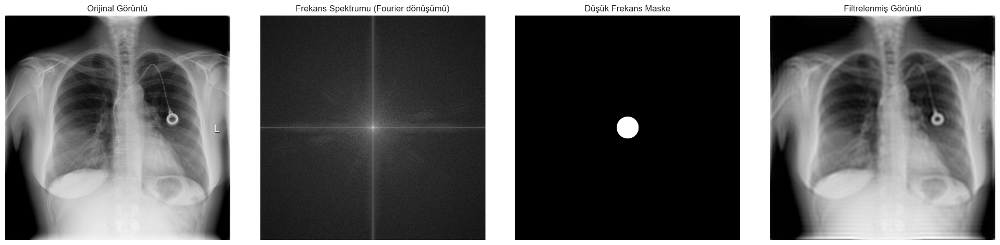

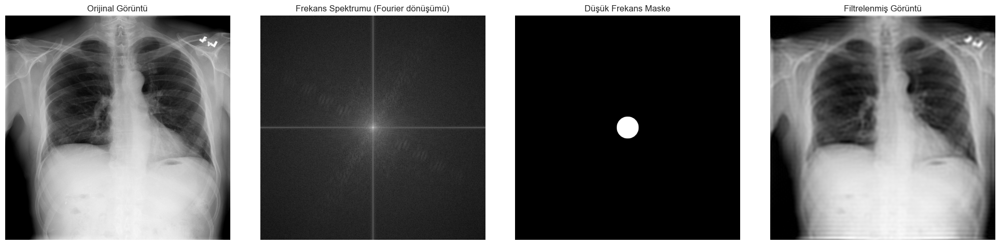

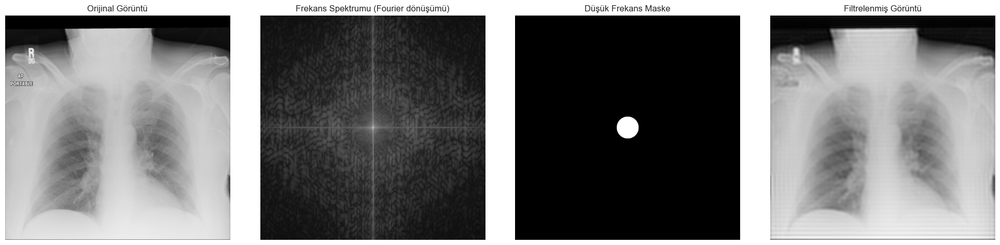

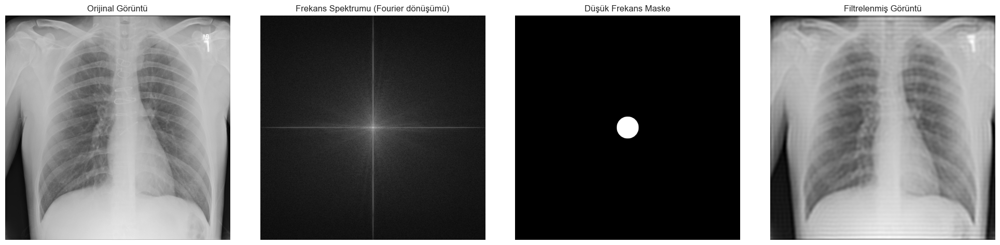

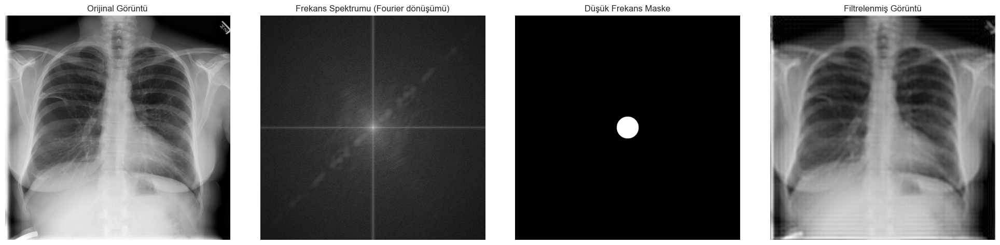

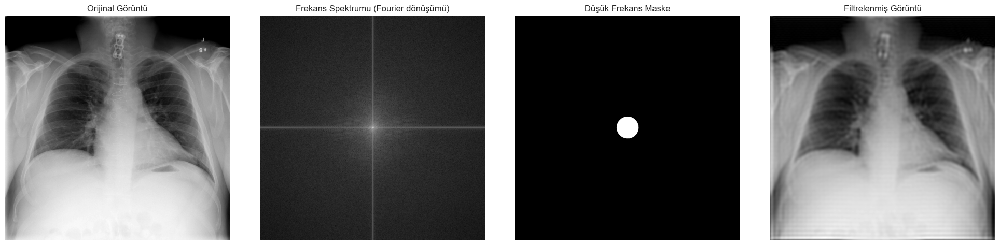

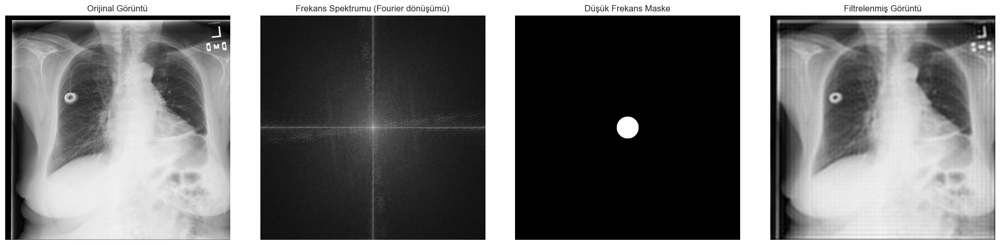

In [15]:
for i, ax_row in enumerate(axes):  # Her bir satır için
    img_path = selected_images.iloc[i]
    full_img_path = os.path.join(image_folder, img_path)
    img = mpimg.imread(full_img_path)  # Görüntüyü okuma
    image_array = np.array(img)

    random_angle = np.random.uniform(5, 10)

    # 1. Fourier Dönüşümü
    f_transform = np.fft.fft2(image_array)  # 2D Fourier dönüşümü
    f_shift = np.fft.fftshift(f_transform)  # Sıfır frekansı merkeze taşır
    magnitude_spectrum = np.log1p(np.abs(f_shift))  # Frekans büyüklük spektrumu
    
    # 2. Düşük Frekans Geçiren Maske Uygulama
    rows, cols = image_array.shape
    crow, ccol = rows // 2, cols // 2  # Merkezi koordinatlar
    mask = np.zeros((rows, cols), np.uint8)  # Boş maske oluştur
    radius = 50  # Düşük frekansları geçiren maske yarıçapı
    y, x = np.ogrid[:rows, :cols]
    mask_area = (x - ccol) ** 2 + (y - crow) ** 2 <= radius ** 2
    mask[mask_area] = 1
    
    # Maskeyi Fourier dönüşümüne uygula
    f_shift_filtered = f_shift * mask
    
    # Ters Fourier Dönüşümü
    f_ishift = np.fft.ifftshift(f_shift_filtered)
    filtered_image = np.abs(np.fft.ifft2(f_ishift))
    #filtered_image = (filtered_image - filtered_image.min()) / (filtered_image.max() - filtered_image.min())

    
    plt.figure(figsize=(20, 5))  # Daha geniş bir figür boyutu belirlenir

    # Orijinal Görüntü
    plt.subplot(1, 4, 1)  # 1 satır, 4 sütun, 1. görsel
    plt.title("Orijinal Görüntü")
    plt.imshow(image_array, cmap="gray")
    plt.axis("off")
    
    # Frekans Büyüklük Spektrumu
    plt.subplot(1, 4, 2)  # 1 satır, 4 sütun, 2. görsel
    plt.title("Frekans Spektrumu (Fourier dönüşümü)")
    plt.imshow(magnitude_spectrum, cmap="gray")
    plt.axis("off")
    
    # Maske
    plt.subplot(1, 4, 3)  # 1 satır, 4 sütun, 3. görsel
    plt.title("Düşük Frekans Maske")
    plt.imshow(mask, cmap="gray")
    plt.axis("off")
    
    # Filtrelenmiş Görüntü
    plt.subplot(1, 4, 4)  # 1 satır, 4 sütun, 4. görsel
    plt.title("Filtrelenmiş Görüntü")
    plt.imshow(filtered_image, cmap="gray")
    plt.axis("off")
    
    # Görselleri sıkıştırmadan yerleştirme
    plt.tight_layout(pad=2.0)
    plt.show()


plt.show()

# Fourier dönüşümü ile görüntüyü frekans alanına çevrildi. Düşük frekansları geçiren maske uygulandı. Ardından ters Fourier dönüşümü ile frekans alanında filtreleme yapıldı.

In [21]:
for i, ax_row in enumerate(axes):  # Her bir satır için - Bu döngü içinde for gibi ayrıca döngü olması sebebiyle biraz geç geliyor görseller...

    # Yükleme uzun süreceği için bekleniyor mesajı
    clear_output(wait=True)  
    display("Görseller işleniyor hocam. Biraz uzun sürüyor bu işlem sanırım iç içe iki for işleminden kaynaklanıyor")
    
    img_path = selected_images.iloc[i]
    full_img_path = os.path.join(image_folder, img_path)
    img = mpimg.imread(full_img_path)  # Görüntüyü okuma
    image_array = np.array(img)
    image_array = img_as_float(image_array)  # Görüntü değerlerini [0, 1] aralığına normalize eder


    # 1. Keskinleştirme (Unsharp Masking)
    radius = 1  # Gaussian bulanıklık yarıçapı
    amount = 1.5  # Keskinleştirme miktarı
    blurred = gaussian_filter(image_array, sigma=radius)  # Gaussian bulanıklık uygula
    
    
    mask = image_array - blurred  # Detayları çıkar
    sharpened_image = np.clip(image_array + amount * mask, 0, 1)  # Keskinleştirilmiş görüntü


    # 2. Bicubic Enterpolasyon (2x büyütme)
    scale = 2
    rows, cols = sharpened_image.shape
    upsampled_rows, upsampled_cols = int(rows * scale), int(cols * scale)
    upsampled_image = np.zeros((upsampled_rows, upsampled_cols))  # Büyütülmüş boş görüntü
    
    for i in range(upsampled_rows):
        for j in range(upsampled_cols):
            # Bicubic enterpolasyon için koordinatları ölçekleme
            x = i / scale
            y = j / scale
    
            # Komşu dört pikselin koordinatlarını bul
            x0 = int(np.floor(x))
            x1 = min(x0 + 1, rows - 1)
            y0 = int(np.floor(y))
            y1 = min(y0 + 1, cols - 1)
    
            # Piksel değerlerinin ağırlıklarını hesapla
            wx1 = x - x0
            wx0 = 1 - wx1
            wy1 = y - y0
            wy0 = 1 - wy1
    
            # Değerleri enterpolasyon yöntemiyle hesapla
            upsampled_image[i, j] = (
                wx0 * wy0 * sharpened_image[x0, y0]
                + wx1 * wy0 * sharpened_image[x1, y0]
                + wx0 * wy1 * sharpened_image[x0, y1]
                + wx1 * wy1 * sharpened_image[x1, y1]
            )

    
    plt.figure(figsize=(20, 8))  # Daha geniş bir figür boyutu belirlenir

    # Orijinal Görüntü
    plt.subplot(1, 3, 1)  # 1 satır, 3 sütun, 1. görsel
    plt.title("Orijinal Görüntü")
    plt.imshow(image_array, cmap="gray")
    plt.axis("off")
    
    # Keskinleştirilmiş Görüntü
    plt.subplot(1, 3, 2)  # 1 satır, 3 sütun, 2. görsel
    plt.title("Keskinleştirilmiş Görüntü (Unsharp Masking)")
    plt.imshow(sharpened_image, cmap="gray")
    plt.axis("off")
    
    # Büyütülmüş Görüntü
    plt.subplot(1, 3, 3)  # 1 satır, 3 sütun, 3. görsel
    plt.title("Bicubic Enterpolasyon (2x)")
    plt.imshow(upsampled_image, cmap="gray")
    plt.axis("off")
    
    # Görselleri sıkıştırmadan yerleştirme
    plt.tight_layout(pad=2.0)
    plt.show()


plt.show()

clear_output(wait=True)
display("Görseller başarıyla işlendi.")

'Görseller başarıyla işlendi.'

# Burada yapılan işlem keskinleştirme kenarların belirginleştirilmesi işlemi. Bu işlem için önce görseli blur hale getirip sonra orinalden blur halini çıkartıp keskin haliyle kalması sağlanıyor. Daha sonra görüntü piksellerin tektek büyütülmesi şeklinde büyütülme işlemine tabi tutuluyor